# Earthlab UAV Air Quality Project LiDAR Data Download and Processing
David Shean  
December 11, 2021

## Introduction
This will download and process 3DEP LiDAR data (specifically 2021 King County) for a cropped area around user-defined point or polygon

In [1]:
import os

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
import geopandas as gpd
import contextily as cx
from matplotlib_scalebar.scalebar import ScaleBar
import pdal
import rasterio as rio
import rasterio.plot
import rioxarray

In [3]:
import hvplot.pandas

In [4]:
#Set background of output figures to be white (avoids issues with "dark mode" and transparency)
plt.rcParams['savefig.facecolor']='white'

In [5]:
#Default GDAL options for output GeoTiff products
gdalopts = "COMPRESS=LZW,TILED=YES,BIGTIFF=IF_SAFER"

### Define relevant parameters for output

In [6]:
#Grid resolution in units of lidar data, (US Feet for 2021 King Co)
res = 1.5

## Get USGS LiDAR tile index
Some amount of searching is required here, drilling down into the project folders for the corresponding tile index, hopefully more streamlined as 3DEP LiDAR explorer matures
https://prd-tnm.s3.amazonaws.com/LidarExplorer/index.html#/

In [7]:
usgs_tileindex_fn = 'https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/metadata/WA_KingCounty_2021_B21/WA_KingCo_1_2021/spatial_metadata/USGS/USGS_WA_KingCo_1_2021_TileIndex/USGS_WA_KingCo_1_2021_TileIndex.shp'

In [8]:
#Read on the fly with GeoPandas
usgs_tileindex = gpd.read_file('/vsicurl/'+usgs_tileindex_fn)

In [9]:
lidar_crs_wkt = usgs_tileindex.crs.to_wkt()
lidar_crs_wkt

'PROJCRS["NAD83(2011) / Washington North (ftUS)",BASEGEOGCRS["NAD83(2011)",DATUM["NAD83 (National Spatial Reference System 2011)",ELLIPSOID["GRS 1980",6378137,298.257222101,LENGTHUNIT["metre",1]]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433]],ID["EPSG",6318]],CONVERSION["SPCS83 Washington North zone (US Survey feet)",METHOD["Lambert Conic Conformal (2SP)",ID["EPSG",9802]],PARAMETER["Latitude of false origin",47,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8821]],PARAMETER["Longitude of false origin",-120.833333333333,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8822]],PARAMETER["Latitude of 1st standard parallel",48.7333333333333,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8823]],PARAMETER["Latitude of 2nd standard parallel",47.5,ANGLEUNIT["degree",0.0174532925199433],ID["EPSG",8824]],PARAMETER["Easting at false origin",1640416.667,LENGTHUNIT["US survey foot",0.304800609601219],ID["EPSG",8826]],PARAMETER["Northing at false origin",0,LENGTHUNIT["US survey foo

In [10]:
lidar_epsg = 'EPSG:'+str(usgs_tileindex.crs.to_epsg())
lidar_epsg

'EPSG:6597'

In [11]:
#This is compound CRS (skipping for now)
#lidar_epsg = 'EPSG:6597+6360'

### LPC and OPR indices
These are lat/lon indices provided by the vendor.  Probably want to stick with the USGS tile index, as this should be more standardized across datasets

In [12]:
#lpc_index_fn = 'https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/metadata/WA_KingCounty_2021_B21/WA_KingCo_1_2021/spatial_metadata/USGS/lpc_index.gpkg'
#opr_index_fn = 'https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/metadata/WA_KingCounty_2021_B21/WA_KingCo_1_2021/spatial_metadata/USGS/opr_index.gpkg'

In [13]:
#lpc_index = gpd.read_file(lpc_index_fn)
#opr_index = gpd.read_file(opr_index_fn)

In [16]:
topdir = '/Users/dshean/Documents/UW/Earthlab/'
%cd $topdir

/Users/dshean/Documents/UW/Earthlab


## Read in csv with site locations

In [17]:
#This is csv containing coordinates for each flight
csv_fn='flights_with_latlon.csv'

In [18]:
df = pd.read_csv(csv_fn)

In [19]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['lon'], df['lat']), crs='EPSG:4326')

In [20]:
from geoviews import tile_sources as gvts
map_tiles = gvts.EsriImagery

In [21]:
map_tiles * gdf.to_crs('EPSG:3857').hvplot(width=500, height=1000)

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [x,y]

### Group by site_name and compute average coordinates for all flights at each site

In [22]:
df_mean = df.groupby('location').mean()

In [23]:
gdf_mean = gpd.GeoDataFrame(df_mean, geometry=gpd.points_from_xy(df_mean['lon'], df_mean['lat']), crs='EPSG:4326')

In [24]:
#Reproject to lidar crs
gdf_mean_proj = gdf_mean.to_crs(lidar_epsg)

In [25]:
gdf_mean_proj

,Unnamed: 0,X,lon,lat,geometry
location,,,,,
12th Ave S. Viewpoint,12.0,12.0,-122.317498,47.578279,POINT (1274119.967 214471.047)
13th Ave S. & S. Dakota St.,8.0,8.0,-122.316220,47.567092,POINT (1274356.617 210385.200)
Hilltop Park,20.0,20.0,-122.299774,47.489595,POINT (1277877.165 182044.031)
Jefferson Park - Ecology AQ site,5.0,5.0,-122.308785,47.568442,POINT (1276201.091 210841.953)
Judkins Park,9.5,9.5,-122.304622,47.591235,POINT (1277387.733 219134.919)
Magnuson Park,1.5,1.5,-122.251675,47.674499,POINT (1291010.049 249256.438)
Mt. Rainier High School,26.0,26.0,-122.308907,47.398993,POINT (1274985.928 149045.029)
Rainier Beach Playfield,15.0,15.0,-122.273643,47.525890,POINT (1284584.380 195158.909)
Saltwater St Pk,30.0,30.0,-122.323576,47.375378,POINT (1271186.877 140502.570)


### Buffer each site coordinate 

In [26]:
#Units of ft for SPCS lidar
distance = 500

In [27]:
gdf_mean_proj_buff = gdf_mean_proj.buffer(distance)

In [28]:
def nearest_floor(x, a):
    return np.floor(x / a) * a
def nearest_ceil(x, a):
    return np.ceil(x / a) * a
def tap_bounds(site_bounds, res):
    return [nearest_floor(site_bounds[0], res), nearest_floor(site_bounds[1], res), \
            nearest_ceil(site_bounds[2], res), nearest_ceil(site_bounds[3], res)]

## For each site

In [279]:
#site_name = 'Jefferson Park - Ecology AQ site'
#site_name = 'Southern Heights Park'
#site_name = 'Saltwater St Pk'
site_name = 'Magnuson Park'
site_name = 'Judkins Park'

In [280]:
x,y = (gdf_mean_proj.loc[site_name].geometry.x, gdf_mean_proj.loc[site_name].geometry.y)

In [281]:
site_poly = gdf_mean_proj_buff.loc[site_name]

In [282]:
point_wkt = gdf_mean_proj.loc[site_name].geometry.wkt

In [283]:
site_poly_wkt = gdf_mean_proj_buff.loc[site_name].envelope.wkt

In [284]:
site_bounds = gdf_mean_proj_buff.loc[site_name].bounds
site_bounds

(1276887.7331235423, 218634.9188057707, 1277887.7331235423, 219634.9188057707)

In [286]:
site_bounds_tap = tap_bounds(site_bounds, res)
site_bounds_tap

[1276887.0, 218634.0, 1277889.0, 219636.0]

In [287]:
#Use the rounded bounds moving forward
site_bounds = site_bounds_tap

In [288]:
outdir = site_name
if not os.path.exists(outdir):
    os.mkdir(outdir)

In [289]:
#Should replace with site name, removing spaces
out_laz_fn = os.path.join(outdir, 'lpc_pdal.laz')
out_dsm_fn = os.path.join(outdir, 'dsm_pdal.tif')
out_dtm_fn = os.path.join(outdir, 'dtm_pdal.tif')
out_irg_fn = os.path.join(outdir, 'irg_pdal.tif')

### Intersect with tile index

In [290]:
#Intersect with point
#idx = usgs_tileindex.intersects(gdf_mean_proj.loc[site_name].geometry)
#Intersect with polygon (ensures multiple tiles are downloaded)
#idx = usgs_tileindex.intersects(site_poly)
#Extract tile IDs using boolean index
#tile_id_list = usgs_tileindex.loc[idx]['Tile_ID'].values

In [291]:
tile_id_list = usgs_tileindex.cx[site_bounds[0]:site_bounds[2], site_bounds[1]:site_bounds[3]]['Tile_ID'].values

In [292]:
tile_id_list

array(['King_2211'], dtype=object)

In [293]:
#Sample URL, accessed Dec 12, 2021
#laz_url = f'https://rockyweb.usgs.gov/vdelivery/Datasets/Staged/Elevation/LPC/Projects/WA_KingCounty_2021_B21/WA_KingCo_1_2021/LAZ/USGS_LPC_WA_KingCounty_2021_B21_{tile_id}.laz'
#dtm_url = f'https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/OPR/Projects/WA_KingCounty_2021_B21/WA_KingCo_1_2021/TIFF/USGS_OPR_WA_KingCounty_2021_B21_be_{tile_id}.tif'
#dsm_url = f'http://prd-tnm.s3.amazonaws.com/index.html?prefix=StagedProducts/Elevation/metadata/WA_KingCounty_2021_B21/WA_KingCo_1_2021/spatial_metadata/contractor_provided/maximum_surface_height_raster/hh_{tile_id}.tif'

In [294]:
laz_url_list = []
for tile_id in tile_id_list:
    laz_url = f'https://rockyweb.usgs.gov/vdelivery/Datasets/Staged/Elevation/LPC/Projects/WA_KingCounty_2021_B21/WA_KingCo_1_2021/LAZ/USGS_LPC_WA_KingCounty_2021_B21_{tile_id}.laz'
    laz_url_list.append(laz_url)

In [295]:
dtm_url_list = []
for tile_id in tile_id_list:
    dtm_url = f'https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/OPR/Projects/WA_KingCounty_2021_B21/WA_KingCo_1_2021/TIFF/USGS_OPR_WA_KingCounty_2021_B21_be_{tile_id}.tif'
    dtm_url_list.append(dtm_url)

In [296]:
dsm_url_list = []
for tile_id in tile_id_list:
    dsm_url = f'https://prd-tnm.s3.amazonaws.com/StagedProducts/Elevation/metadata/WA_KingCounty_2021_B21/WA_KingCo_1_2021/spatial_metadata/contractor_provided/maximum_surface_height_raster/hh_{tile_id}.tif'
    dsm_url_list.append(dsm_url)

## Generate products with PDAL

### Prepare the merged, cropped laz

In [297]:
#Crop around a point
#laz_pipeline |= pdal.Filter.crop(point=point_wkt, distance=distance)
#Crop using polygon
#laz_pipeline |= pdal.Filter.crop(polygon=site_poly_wkt)

In [298]:
pdal_bounds_str = f'([{site_bounds[0]}, {site_bounds[2]}], [{site_bounds[1]}, {site_bounds[3]}])'
pdal_bounds_str

'([1276887.0, 1277889.0], [218634.0, 219636.0])'

In [299]:
laz_pipeline = pdal.Pipeline()
for url in laz_url_list:
    laz_pipeline |= pdal.Reader(url)
laz_pipeline |= pdal.Filter.merge()
laz_pipeline |= pdal.Filter.crop(bounds=pdal_bounds_str)
laz_pipeline |= pdal.Writer.las(filename=out_laz_fn, compression='laszip')

### Reprojection (if desired)
Need to check on Compound CRS for ITRF2014

In [300]:
#laz_pipeline = pdal.Pipeline()
#laz_pipeline |= pdal.Reader(out_laz_fn)
#laz_pipeline |= pdal.Filter.reprojection(out_srs='EPSG:32610')
#laz_pipeline |= pdal.Writer.las(filename='test_proj.laz', compression='laszip')

In [301]:
laz_pipeline.stages

In [302]:
count = laz_pipeline.execute()

In [303]:
laz_pipeline.arrays[0].shape

(1316860,)

## Write out GDAL grids

In [304]:
#Compute raster width and height
width = (site_bounds[2]-site_bounds[0])/res
height = (site_bounds[3]-site_bounds[1])/res
(width, height)

(668.0, 668.0)

In [305]:
pdal_kwargs = {}
pdal_kwargs['data_type'] = 'float32'
pdal_kwargs['resolution'] = res
pdal_kwargs['origin_x'] = site_bounds[0]
pdal_kwargs['origin_y'] = site_bounds[1]
pdal_kwargs['width'] = width
pdal_kwargs['height'] = height
pdal_kwargs['gdalopts'] = gdalopts

In [306]:
dsm_pipeline = pdal.Pipeline()
dsm_pipeline |= pdal.Reader(out_laz_fn)
dsm_pipeline |= pdal.Filter.returns(groups="first,only")
dsm_pipeline |= pdal.Writer.gdal(filename=os.path.splitext(out_dsm_fn)[0]+'_all.tif', output_type='all', **pdal_kwargs)
dsm_pipeline |= pdal.Writer.gdal(filename=out_dsm_fn, output_type='idw', **pdal_kwargs)

#This is still not strict enough!  Hardcode width and height for all rasters
#bounds=pdal_bounds_str, \

In [307]:
dsm_pipeline.stages

In [308]:
count = dsm_pipeline.execute()

In [309]:
dsm_pipeline.arrays[0].shape

(143576,)

In [310]:
dsm_src = rio.open(out_dsm_fn, mask_and_scale=True)
dsm = dsm_src.read(1, masked=True)

In [311]:
dsm.shape

(668, 668)

In [312]:
dsm_src.transform

Affine(1.5, 0.0, 1276887.0,
       0.0, -1.5, 219636.0)

In [313]:
site_bounds

[1276887.0, 218634.0, 1277889.0, 219636.0]

In [314]:
dsm_src.bounds

BoundingBox(left=1276887.0, bottom=218634.0, right=1277889.0, top=219636.0)

In [315]:
irg_pipeline = pdal.Pipeline()
irg_pipeline |= pdal.Reader(out_laz_fn)
irg_pipeline |= pdal.Filter.returns(groups="first,only")
irg_pipeline |= pdal.Writer.gdal(filename=os.path.splitext(out_irg_fn)[0]+'_all.tif', output_type='all', dimension='Intensity', **pdal_kwargs)
irg_pipeline |= pdal.Writer.gdal(filename=out_irg_fn, output_type='idw', dimension='Intensity', **pdal_kwargs)
#origin_x=site_bounds[0], origin_y=site_bounds[1], \
#width=dsm_src.width, height=dsm_src.height

In [316]:
irg_pipeline.stages

In [317]:
count = irg_pipeline.execute()

In [318]:
irg_pipeline.arrays[0].shape

(143576,)

In [319]:
dtm_pipeline = pdal.Pipeline()
dtm_pipeline |= pdal.Reader(out_laz_fn)
#Isolate points classified as ground returns
dtm_pipeline |= pdal.Filter.range(limits='Classification[2:2]')
#pdal.Filter.delaunay() | \
#Note: window_size does secondary interpolation to fill gaps (needed for DTM)
dtm_pipeline |= pdal.Writer.gdal(filename=os.path.splitext(out_dtm_fn)[0]+'_all.tif', output_type='all', window_size=9, **pdal_kwargs)
dtm_pipeline |= pdal.Writer.gdal(filename=out_dtm_fn, output_type='idw', window_size=9, **pdal_kwargs)
#origin_x=extent[0], origin_y=extent[2], \
#width=dsm_src.width, height=dsm_src.height)

In [320]:
dtm_pipeline.stages

In [321]:
count = dtm_pipeline.execute()

In [322]:
dtm_pipeline.arrays[0].shape

(342062,)

## Prepare 3DEP raster products

In [336]:
dtm_3DEP_fn = os.path.join(outdir, 'dtm_3DEP.tif')
dtm_3DEP_vrt_fn = os.path.join(outdir, 'dtm_3DEP.vrt')
dsm_3DEP_fn = os.path.join(outdir, 'dsm_3DEP.tif')
dsm_3DEP_vrt_fn = os.path.join(outdir, 'dsm_3DEP.vrt')

In [324]:
dtm_url_list_str = ' '.join(['/vsicurl/'+url for url in dtm_url_list])
dsm_url_list_str = ' '.join(['/vsicurl/'+url for url in dsm_url_list])

In [325]:
site_bounds

[1276887.0, 218634.0, 1277889.0, 219636.0]

In [326]:
left, bottom, right, top = [str(s) for s in site_bounds]

In [327]:
dsm_src.width, dsm_src.height

(668, 668)

In [328]:
dsm_src.bounds

BoundingBox(left=1276887.0, bottom=218634.0, right=1277889.0, top=219636.0)

In [329]:
#Use the PDAL tif output to determine vrt bounds (safest approach)
left, bottom, right, top = [str(s) for s in dsm_src.bounds]

In [337]:
!gdalbuildvrt -r nearest -tr $res $res -te $left $bottom $right $top "$dtm_3DEP_vrt_fn" $dtm_url_list_str
#!gdal_translate -r nearest -tr $res $res -projwin $left $top $right $bottom $dtm_url_list_str "$dtm_3DEP_fn"
#!gdalwarp -overwrite -r nearest -tr $res $res -te $left $bottom $right $top $dtm_url_list_str "$dtm_3DEP_fn"

0...10...20...30...40...50...60...70...80...90...100 - done.
Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_2211.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes


In [338]:
!gdalbuildvrt -r nearest -tr $res $res -te $left $bottom $right $top "$dsm_3DEP_vrt_fn" $dsm_url_list_str
#!gdal_translate -r nearest -tr $res $res -projwin $left $top $right $bottom $dsm_url_list_str "$dsm_3DEP_fn"
#!gdalwarp -overwrite -r nearest -tr $res $res -te $left $bottom $right $top $dsm_url_list_str "$dsm_3DEP_fn"

0...10...20...30...40...50...60...70...80...90...100 - done.


In [332]:
dtm_3DEP_src = rio.open(dtm_3DEP_fn)

In [333]:
dtm_3DEP_src.bounds

BoundingBox(left=1276887.0, bottom=218634.0, right=1277889.0, top=219636.0)

In [334]:
dtm_3DEP_src.width, dtm_3DEP_src.height

(668, 668)

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_2732.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes
Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_2733.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes
...10...20...30...40...50...60...70...80...90...100 - done.


Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_2732.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes
Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_2733.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes


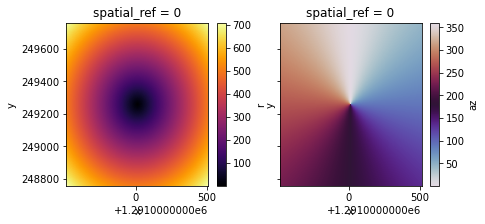

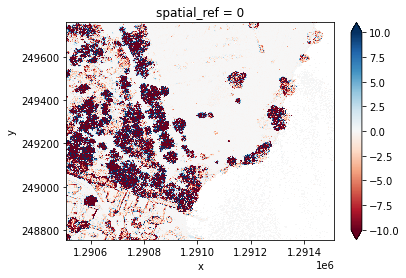

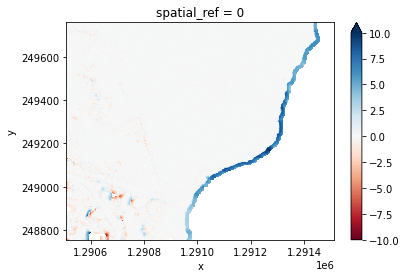

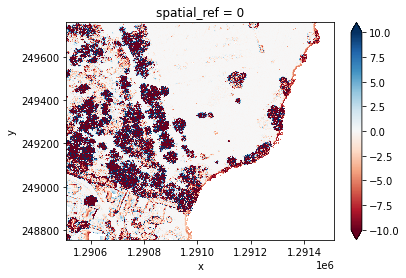

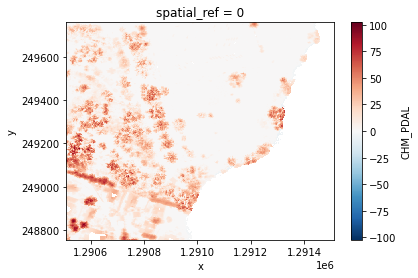

...

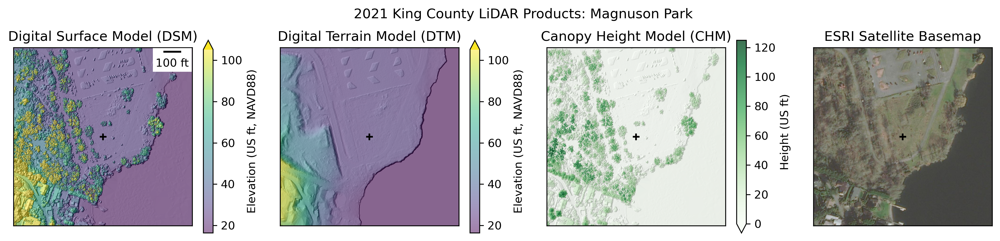

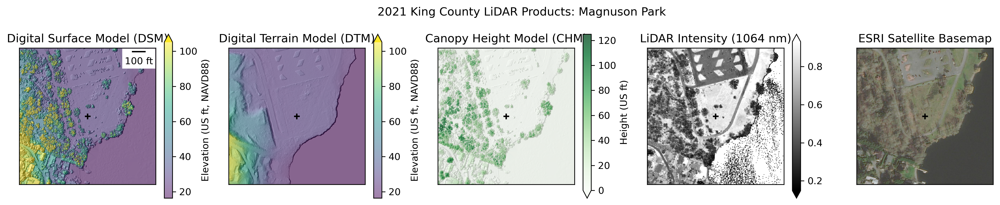

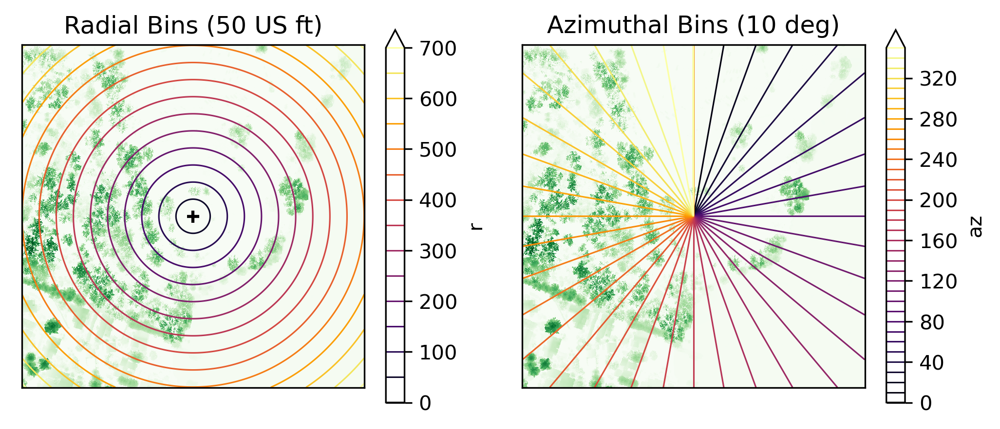

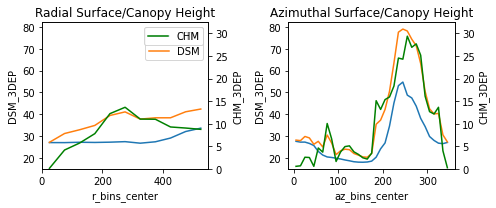

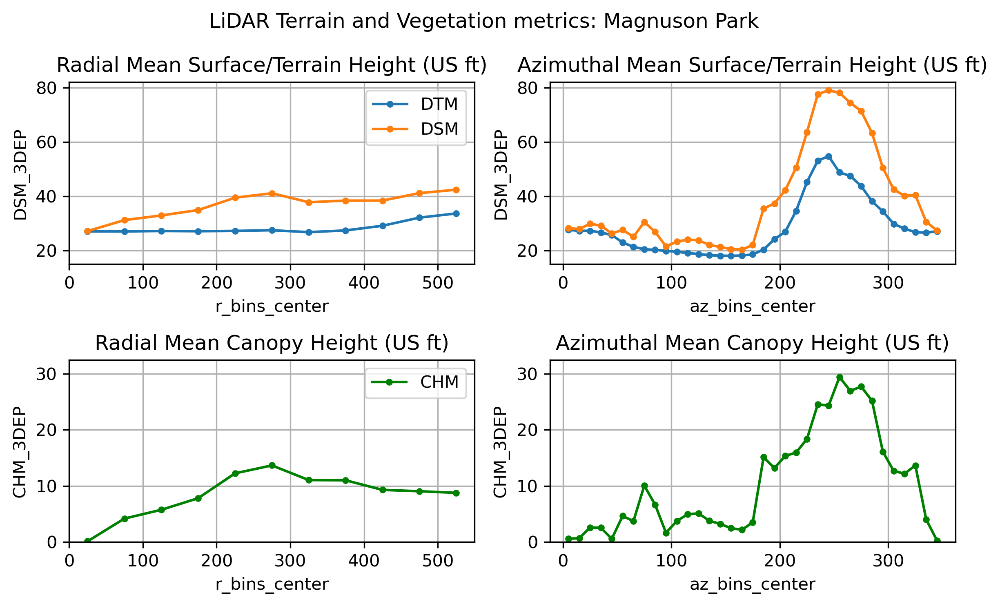

In [150]:
%run ./EarthLab_AQ_LiDAR_analysis.ipynb

# Scratch


In [148]:
#dtm_vrt_src = rio.open(dtm_vrt_fn)

In [149]:
#w = rasterio.windows.from_bounds(*dsm_src.bounds, transform=dtm_vrt_src.transform)
#dtm_3dep = dtm_vrt_src.read(1, masked=True, window=w)

In [764]:
gdal_opt = '-co TILED=YES -co COMPRESS=LZW -co BIGTIFF=IF_SAFER'

In [412]:
!gdaldem hillshade $gdal_opt -multidirectional "$out_dsm_fn" "$out_dsm_fn_hs"
!gdaldem hillshade $gdal_opt -multidirectional "$out_dtm_fn" "$out_dtm_fn_hs"

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.


In [268]:
dsm_hs_src = rio.open(out_dsm_fn_hs, mask_and_scale=True)
dsm_hs = dsm_hs_src.read(1, masked=True)

In [269]:
dtm_src = rio.open(out_dtm_fn, mask_and_scale=True)
dtm = dtm_src.read(1, masked=True)
dtm_hs_src = rio.open(out_dtm_fn_hs, mask_and_scale=True)
dtm_hs = dtm_hs_src.read(1, masked=True)

In [288]:
dtm_3dep_src = rio.open(dtm_vrt_fn)
#w = rasterio.windows.from_bounds(*dsm_src.bounds, transform=dtm_3dep_src.transform)
dtm_3dep = dtm_3dep_src.read(1, masked=True) #window=w
dsm_3dep_src = rio.open(dsm_vrt_fn)
#w = rasterio.windows.from_bounds(*dsm_src.bounds, transform=dtm_3dep_src.transform)
dsm_3dep = dsm_3dep_src.read(1, masked=True) #window=w

Warning 1: USGS_OPR_WA_KingCounty_2021_B21_be_King_1081.tif: This file used to have optimizations in its layout, but those have been, at least partly, invalidated by later changes


In [289]:
#dsm_xds = rioxarray.open_rasterio(out_dsm_fn, mask_and_scale=True)
#dsm_hs_xds = rioxarray.open_rasterio(out_dsm_fn_hs, mask_and_scale=True)

In [290]:
#dtm_xds = rioxarray.open_rasterio(out_dtm_fn, mask_and_scale=True)
#dtm_hs_xds = rioxarray.open_rasterio(out_dtm_fn_hs, mask_and_scale=True)
#dtm_xds = rioxarray.open_rasterio(dtm_fn, mask_and_scale=True)

In [291]:
#dtm_xds.rio.reproject_match(dsm_xds)

In [292]:
#chm = dsm_xds.squeeze() - dtm_xds.squeeze()

In [293]:
chm = dsm - dtm

In [294]:
#chm_3dep = dsm - dtm_3dep

In [295]:
def hide_ticks(ax):
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

In [296]:
fig_fn = os.path.join(outdir, site_name+'.png')
fig_fn

'Saltwater St Pk/Saltwater St Pk.png'

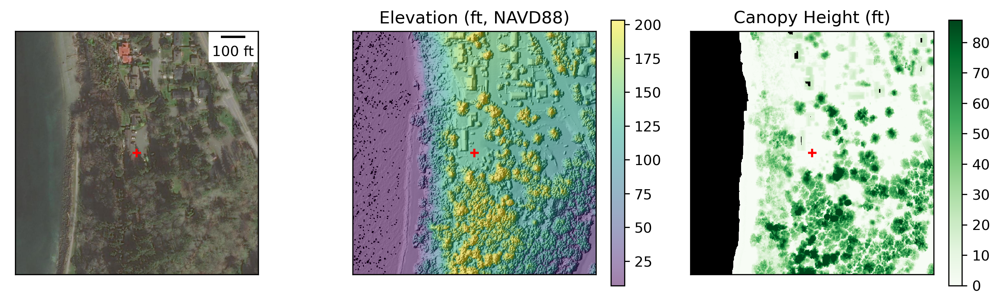

In [309]:
f, axa = plt.subplots(1, 3, figsize=(10,3), sharex=True, sharey=True, dpi=300)
#dsm_xds.plot(ax=axa[1])
#dsm_hs_xds.squeeze().plot(ax=axa[1], cmap='gray', robust=True)
#dsm_xds.squeeze().plot(ax=axa[1], cmap='viridis', alpha=0.5,robust=True)
sb = ScaleBar(1, 'ft', dimension="imperial-length", fixed_value=100)

clim = np.nanpercentile(dsm_hs, (2, 98))
axa[1].imshow(dsm_hs, extent=extent, cmap='gray', clim=clim)
clim = np.nanpercentile(dsm.compressed(), (2, 98))
m = axa[1].imshow(dsm, extent=extent, alpha=0.5, clim=clim)
title = 'DSM Elevation (ft, NAVD88)'
axa[1].set_title(title)
axa[1].scatter(x,y, marker='+', color='r')
f.colorbar(m, ax=axa[1])

m = cx.add_basemap(axa[0], crs=lidar_epsg, source=cx.providers.Esri.WorldImagery, attribution=False)
axa[0].scatter(x,y, marker='+', color='r')
#Hack to resize the 
cb = f.colorbar(m, ax=axa[0])
cb.remove()

#divider1 = make_axes_locatable(axa[0])
#cax1 = divider1.append_axes("right", size="5%", pad=0.05)

clim = (0, np.nanpercentile(chm.compressed(), 98))
m = axa[2].imshow(chm, extent=extent, cmap='Greens', clim=clim)
title = 'Canopy Height (ft)'
axa[2].set_title(title)
axa[2].scatter(x,y, marker='+', color='r')
f.colorbar(m, ax=axa[2])

for ax in axa:
    ax.set_facecolor('k')
    hide_ticks(ax)
axa[0].add_artist(sb)

plt.suptitle(f'
plt.tight_layout()
#plt.savefig(fig_fn)

In [ ]:
f, axa = plt.subplots(1, 3, figsize=(10,3), sharex=True, sharey=True, dpi=300)
#dsm_xds.plot(ax=axa[1])
#dsm_hs_xds.squeeze().plot(ax=axa[1], cmap='gray', robust=True)
#dsm_xds.squeeze().plot(ax=axa[1], cmap='viridis', alpha=0.5,robust=True)
sb = ScaleBar(1, 'ft', dimension="imperial-length", fixed_value=100)

clim = np.nanpercentile(dsm_hs, (2, 98))
axa[1].imshow(dsm_hs, extent=extent, cmap='gray', clim=clim)
clim = np.nanpercentile(dsm.compressed(), (2, 98))
m = axa[1].imshow(dsm, extent=extent, alpha=0.5, clim=clim)
title = 'DSM Elevation (ft, NAVD88)'
axa[1].set_title(title)
axa[1].scatter(x,y, marker='+', color='r')
f.colorbar(m, ax=axa[1])

m = cx.add_basemap(axa[0], crs=lidar_epsg, source=cx.providers.Esri.WorldImagery, attribution=False)
axa[0].scatter(x,y, marker='+', color='r')
#Hack to resize the 
cb = f.colorbar(m, ax=axa[0])
cb.remove()

#divider1 = make_axes_locatable(axa[0])
#cax1 = divider1.append_axes("right", size="5%", pad=0.05)

clim = (0, np.nanpercentile(chm.compressed(), 98))
m = axa[2].imshow(chm, extent=extent, cmap='Greens', clim=clim)
title = 'Canopy Height (ft)'
axa[2].set_title(title)
axa[2].scatter(x,y, marker='+', color='r')
f.colorbar(m, ax=axa[2])

for ax in axa:
    ax.set_facecolor('k')
    hide_ticks(ax)
axa[0].add_artist(sb)

plt.suptitle(f'
plt.tight_layout()
#plt.savefig(fig_fn)